<p style="align: center;"><img src="https://static.tildacdn.com/tild6636-3531-4239-b465-376364646465/Deep_Learning_School.png", width=500></p>

## 1) Framework
* I chose the `torchvision.models.detection` framework.

In [2]:
import os
import PIL
from pathlib import Path
from PIL import Image
import cv2
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format




from sklearn.model_selection import train_test_split

import torch
torch.manual_seed(12345)
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor


import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

%matplotlib inline


import time
from datetime import timedelta
import wandb
from wandb import AlertLevel
from torchmetrics.detection.mean_ap import MeanAveragePrecision



from torch.optim import lr_scheduler
from torchvision import transforms, models, datasets
from torch.utils.data import Dataset, DataLoader

from tqdm import tqdm

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [20]:
# Load pretrained model
model_box = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained='True')

## 2) Let see how it works on a random image.

In [18]:
# Download an image of a tiger from Wiki
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Sher_Khan_%28cropped%29.jpg/1280px-Sher_Khan_%28cropped%29.jpg -O sample_photo.jpg

--2023-01-28 16:57:37--  https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Sher_Khan_%28cropped%29.jpg/1280px-Sher_Khan_%28cropped%29.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 350049 (342K) [image/jpeg]
Saving to: ‘sample_photo.jpg’

sample_photo.jpg    100%[===================>] 341.84K  1.41MB/s    in 0.2s    

2023-01-28 16:57:38 (1.41 MB/s) - ‘sample_photo.jpg’ saved [350049/350049]



In [ ]:
# Download an image of a tiger from Wiki
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Sher_Khan_%28cropped%29.jpg/1280px-Sher_Khan_%28cropped%29.jpg -O sample_photo.jpg
    
# Transform to numpy and normalize
img = cv2.imread('/kaggle/working/sample_photo.jpg') # в numpy array , cv2.IMREAD_COLOR
image_res = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
image_res = cv2.resize(image_res, (400, 300), cv2.INTER_AREA)/255.0 # normalize
plt.figure(figsize=(12, 8))
plt.imshow(image_res)
plt.show()    

In [21]:
# Transform to the model format (+ add dimension)
img_torch = torch.Tensor(np.rollaxis(image_res, 2, 0))
img_torch = torch.unsqueeze(img_torch, dim=0)
img_torch.size()

torch.Size([1, 3, 300, 400])

In [21]:
# Let's get a prediction
model_box.eval()
with torch.no_grad():
    pred = model_box(img_torch)     

In [23]:
# https://discuss.pytorch.org/t/output-of-torchvision-models-detection-fasterrcnn-resnet50-fpn/136407
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

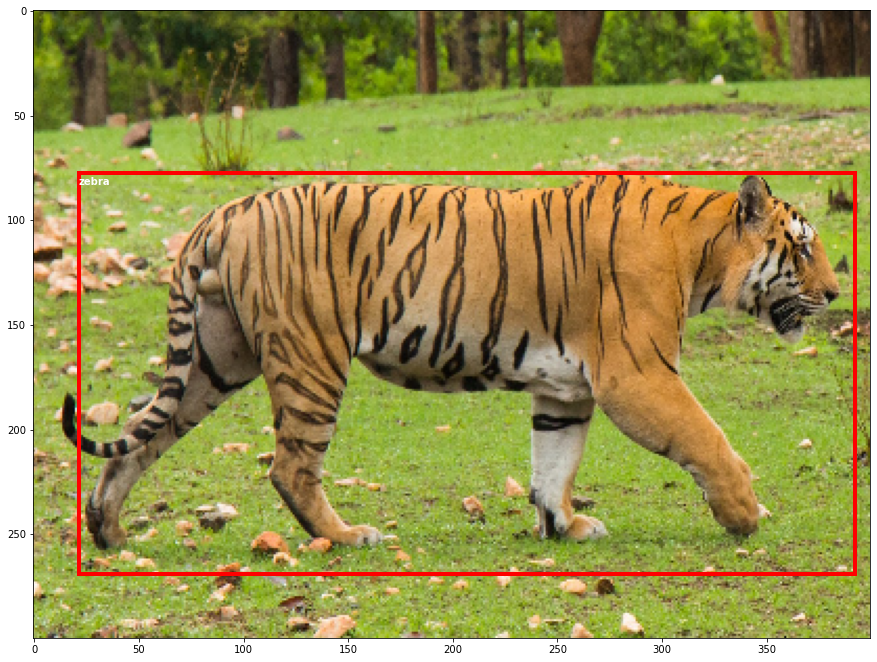

In [24]:
# Print an image + boxes
fig, ax = plt.subplots(1, figsize=(15,15))
ax.imshow(image_res)
for n, pr in enumerate(pred):
    boxes = pred[n]['boxes'].cpu().detach().numpy()
    labels = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[n]['labels'].cpu().detach().numpy())] 
    scores = pred[n]['scores'].cpu().detach().numpy()
    boxes = boxes[scores > 0.5]
    for ind, b in enumerate(boxes):
        left, bot, right, top = b 
        x, y, w, h = [val for val in [left, bot, right - left, top - bot]]
        rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor='r', fill=False) 
        ax.add_patch(rect)
        ax.annotate(labels[ind], (x,y+2), color='white', weight='bold',
                    ha='left', va='top', font='FONT_HERSHEY_SIMPLEX') 
plt.show()    

In [25]:
del(model_box)
torch.cuda.empty_cache()

**Summary**
* The model quite accurately determines the boundaries of the animal, but since `COCO_INSTANCE_CATEGORY_NAMES` does not contain a tiger label, then the class prediction is incorrect.

## 3)  Dataset

Source: `Reconyx Camera Trap data set`. X. Yu, J. Wang, R. Kays, P. A. Jansen, T. Wang, and T. Huang,
“Automated identification of animal species in camera trap images,” EURASIP Journal on Image and Video Processing, vol. 2013, no. 1, p. 52, 2013. https://jivp-eurasipjournals.springeropen.com/articles/10.1186/1687-5281-2013-52

Data were downloaded from https://borealisdata.ca/dataset.xhtml?persistentId=doi:10.5683/SP/TPB5ID

In [3]:
# Image directory
DIR = Path('/kaggle/input/reconyxcameratrapdata/images')

In [4]:
# Labels and bounding boxes 
labels_df = pd.read_csv('/kaggle/input/reconyxcameratrapdata/camera_trap_all_labels.csv')
labels_df = labels_df.rename(columns={'class':'label'})
print(labels_df.shape)
labels_df.head()

(1262, 8)


,filename,width,height,label,xmin,ymin,xmax,ymax
0,SEQ75016_IMG_0001.JPG,1920,1080,Tinamou,26,486,253,678
1,SEQ75016_IMG_0001.JPG,1920,1080,Tinamou,969,390,1248,620
2,SEQ75016_IMG_0002.JPG,1920,1080,Tinamou,107,486,313,648
3,SEQ75016_IMG_0002.JPG,1920,1080,Tinamou,1026,381,1278,579
4,SEQ75016_IMG_0003.JPG,1920,1080,Tinamou,160,497,395,645


In [5]:
labels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1262 entries, 0 to 1261
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  1262 non-null   object
 1   width     1262 non-null   int64 
 2   height    1262 non-null   int64 
 3   label     1262 non-null   object
 4   xmin      1262 non-null   int64 
 5   ymin      1262 non-null   int64 
 6   xmax      1262 non-null   int64 
 7   ymax      1262 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 79.0+ KB


**Summary*:
* All data uploaded.

## 4) Data preprocessing

In [5]:
# Create a dictionary of unique classes
label2target = {l:t+1 for t,l in enumerate(labels_df['label'].unique())}

# Add 0 for background
label2target['background'] = 0
target2label = {t:l for l,t in label2target.items()}
background_class = label2target['background']
num_classes = len(label2target)
     

* Let's see the smallest area of an object. 

In [6]:
# Calculate area of each box
boxes = labels_df[['xmin','ymin','xmax','ymax']].values 
area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
labels_df['area'] = area
labels_df.sort_values(by='area').head()

,filename,width,height,label,xmin,ymin,xmax,ymax,area
788,SEQ77316_IMG_0010.JPG,2048,1536,Mouflon,1462,780,1488,801,546
774,SEQ77316_IMG_0009.JPG,2048,1536,Mouflon,1363,773,1389,798,650
775,SEQ77316_IMG_0009.JPG,2048,1536,Mouflon,1457,769,1480,800,713
745,SEQ77316_IMG_0007.JPG,2048,1536,Mouflon,1617,769,1643,800,806
806,SEQ77353_IMG_0001.JPG,2048,1536,Mouflon,403,837,439,862,900


* There are two images with too small objects less then 800 pixels. Let's delete them.

In [7]:
labels_df = labels_df.query('area > 800')

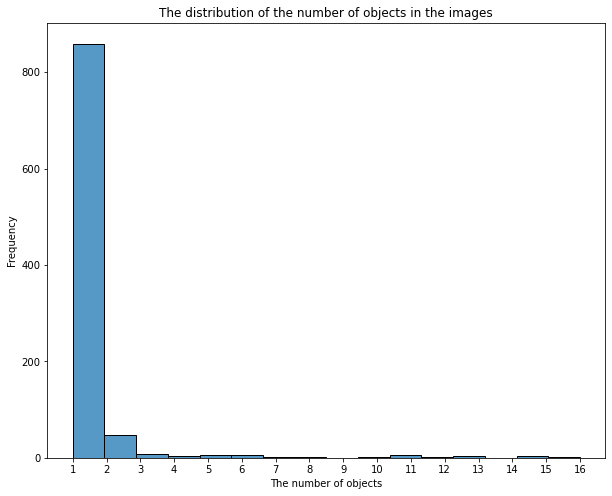

In [7]:
# Let's see the distribution of the number of objects in the images
plt.figure(figsize=(10, 8))
sns.histplot(labels_df.groupby('filename')['label'].count(), bins=16)
plt.xticks(np.arange(1,17, step=1))
plt.title('The distribution of the number of objects in the images')
plt.xlabel('The number of objects')
plt.ylabel('Frequency')
plt.show()

* Most often there is only 1 object in the image.

Number of species: 20


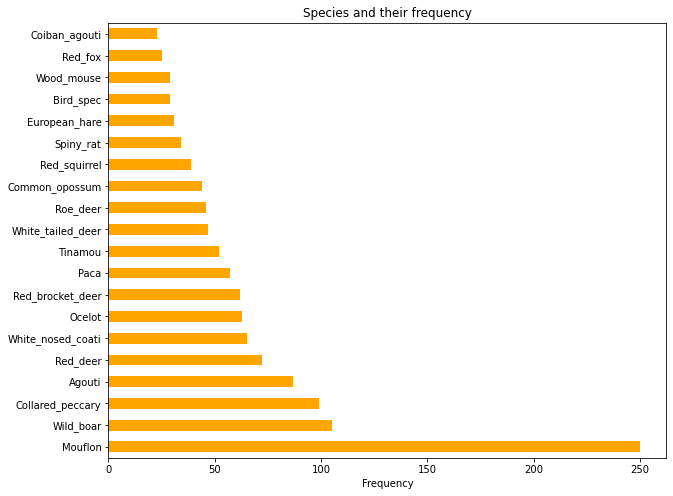

In [8]:
print('Number of species:', labels_df['label'].nunique())
plt.figure(figsize=(10, 8))
labels_df['label'].value_counts().plot(kind='barh', color='orange')
plt.xlabel('Frequency')
plt.title('Species and their frequency')
None

* There are 20 different animal species.
* This is an imbalanced dataset.

In [8]:
# Split data into train/val/test datasets
train_val_test_list = labels_df.filename.unique()

train_files, val_test_files = train_test_split(train_val_test_list, test_size=0.25, random_state=12345)
val_files, test_files = train_test_split(val_test_files, test_size=0.10, random_state=12345)

train_labels = labels_df.query('filename in @ train_files')
val_labels = labels_df.query('filename in @ val_files')
test_labels = labels_df.query('filename in @ test_files')


print(len(train_files), len(val_files), len(test_files))

709 213 24


In [9]:
# Let's see on the class ditribution after splitting
data = [train_labels ['label'].value_counts(normalize=True),
       val_labels ['label'].value_counts(normalize=True)]
(pd.DataFrame(data, 
              index = ['train_labels', 'valid_labels']).T)\
            .reset_index()\
            .set_index("index")

,train_labels,valid_labels
index,,
Mouflon,0.20,0.19
Wild_boar,0.09,0.07
Collared_peccary,0.07,0.08
Agouti,0.07,0.07
Red_deer,0.06,0.06
Red_brocket_deer,0.05,0.04
Ocelot,0.05,0.05
White_nosed_coati,0.05,0.06
Paca,0.05,0.03


* The class distribution does not seem to differ much between the training and validation sets.

In [10]:
# Create a Dataset class
class AnimalDataset(Dataset):

    def __init__(self, df, image_dir, width, height, transform=None): 
        super().__init__()

        self.image_ids = df['filename'].unique() # Unique image titles/indexes from CSV file
        self.df = df # labels_df
        self.image_dir = image_dir # Image folder directory
        self.transform = transform 
        self.width = width
        self.height =  height

    def __len__(self) -> int:
        return self.image_ids.shape[0] # the number of unique images
    
    
    
     
    def __getitem__(self, index: int):

        image_id = self.image_ids[index] # iterate through the indexes of unique images
        image_path = os.path.join(self.image_dir, image_id)
   
        image = cv2.imread(image_path) # image format to numpy array + cv2.IMREAD_COLOR
        image_res = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_res = cv2.resize(image_res, (self.width, self.height), cv2.INTER_AREA)/255.0 # normalize from 0 до 1
                    
        
        records = self.df[self.df['filename'] == image_id].copy()   # the table is sorted by the index of the current image
        
        # re-calculate the coordinates by dividing by the true size of the image and multiplying by the size after resize()
        records['xmin_corr'] = (records['xmin'] / records['width'])*self.width 
        records['xmax_corr'] = (records['xmax'] / records['width'])*self.width
        records['ymax_corr'] = (records['ymax'] / records['height'])*self.height
        records['ymin_corr'] = (records['ymin'] / records['height'])*self.height
        
        boxes = records[['xmin_corr','ymin_corr','xmax_corr','ymax_corr']].values # Combine the received coordinates into a single array
        boxes = torch.as_tensor(boxes, dtype=torch.float32) # Transform numpy to tensor
        
        # Boxes area
        area =  records['area'].values.tolist()  #(boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) 
        area = torch.as_tensor(area, dtype=torch.float32)


        labels = records['label'].values.tolist() # Get the vector of true labels
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)
        
        # combine all not images data into a target
        target = {}
        target['boxes'] = boxes
        target['labels'] = torch.Tensor([label2target[i] for i in labels]).long()
        target['image_id'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd
        
        
        
        
        if self.transform is not None: # For training data
                    self.transform = A.Compose([A.OneOf([A.RandomRotate90(p=1), # Albumentation
                                                          A.VerticalFlip(p=1)], p=0.5),
                                    ToTensorV2(p=0.1)],     # ToTensorV2 converts image to PyTorch tensor without dividing by 255
                                    bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))


                    tr = self.transform(image=image_res, bboxes=target['boxes'], labels=labels)
                    im = tr['image']
                    bx = tr['bboxes']
                    target['boxes'] = torch.Tensor(tr['bboxes'])
                    
                    return im, target
        else: # For val/test data
            return torch.Tensor(np.rollaxis(image_res, 2, 0)), target


In [11]:
# Create a tuple from each batch 
def collate_fn(batch):
    return tuple(zip(*batch))

In [39]:
# Create Datasets
train_dataset = AnimalDataset(train_labels, DIR, 400, 400, transform = True)
val_dataset = AnimalDataset(val_labels, DIR, 400, 400, transform = None)
test_dataset = AnimalDataset(test_labels, DIR, 1000, 1000, transform = None)


In [40]:
# Create Dataloaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2, collate_fn=collate_fn, drop_last=True, pin_memory=True) 
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn, drop_last=True, pin_memory=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2, collate_fn=collate_fn, drop_last=True, pin_memory=True)

In [14]:
# Number of batches in each loader
n_batches_train, n_batches_val,  n_batches_test = len(train_loader), len(val_loader), len(test_loader)

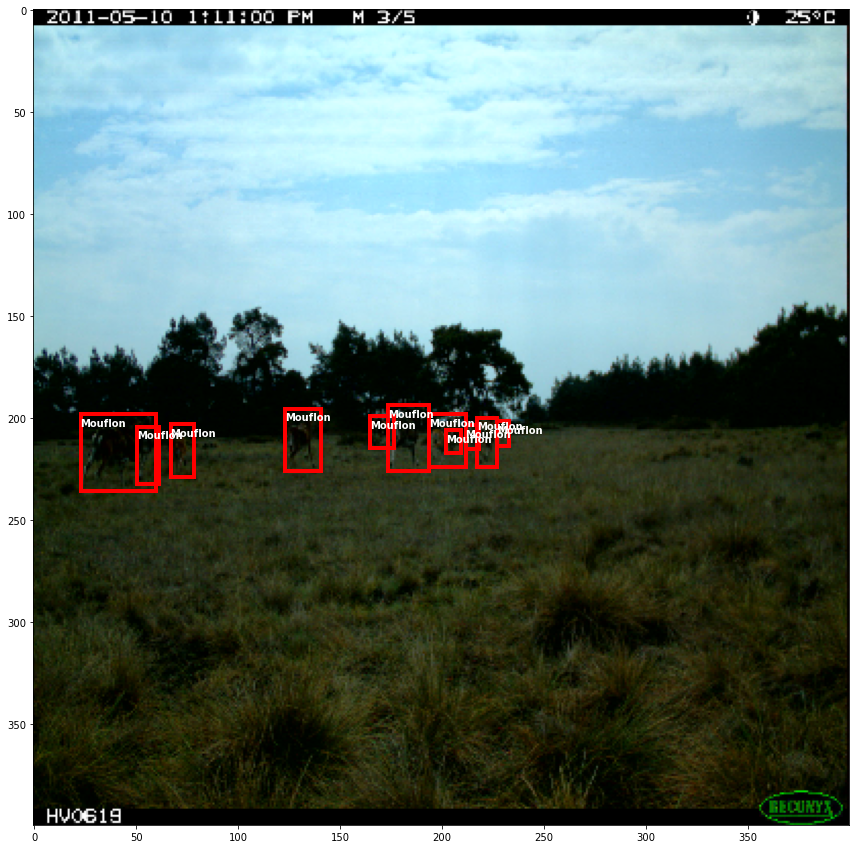

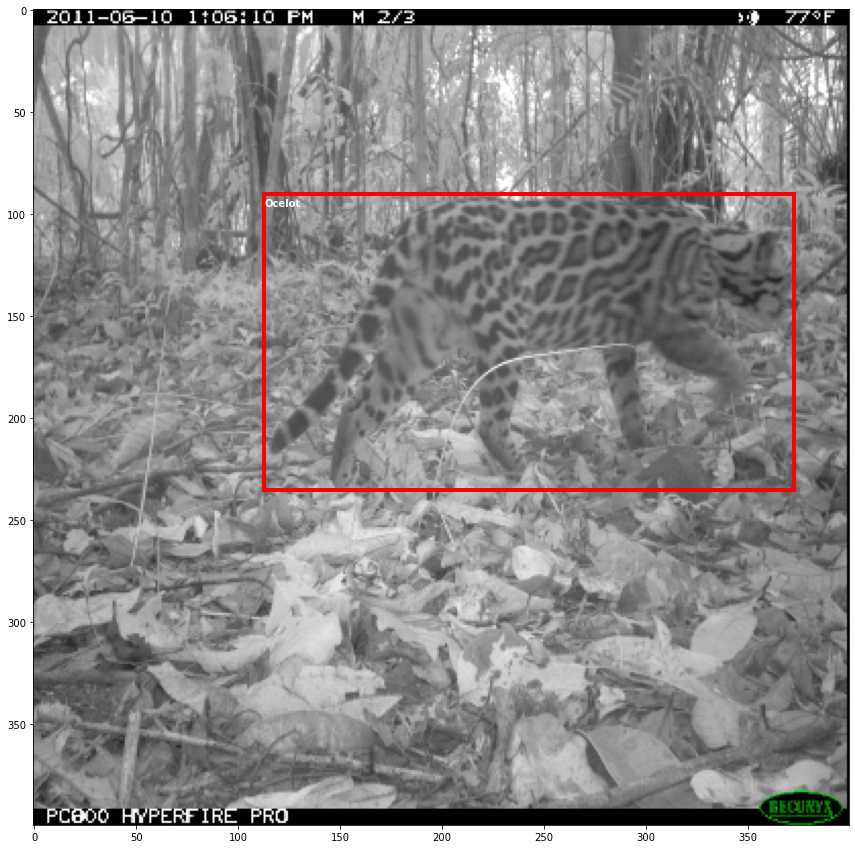

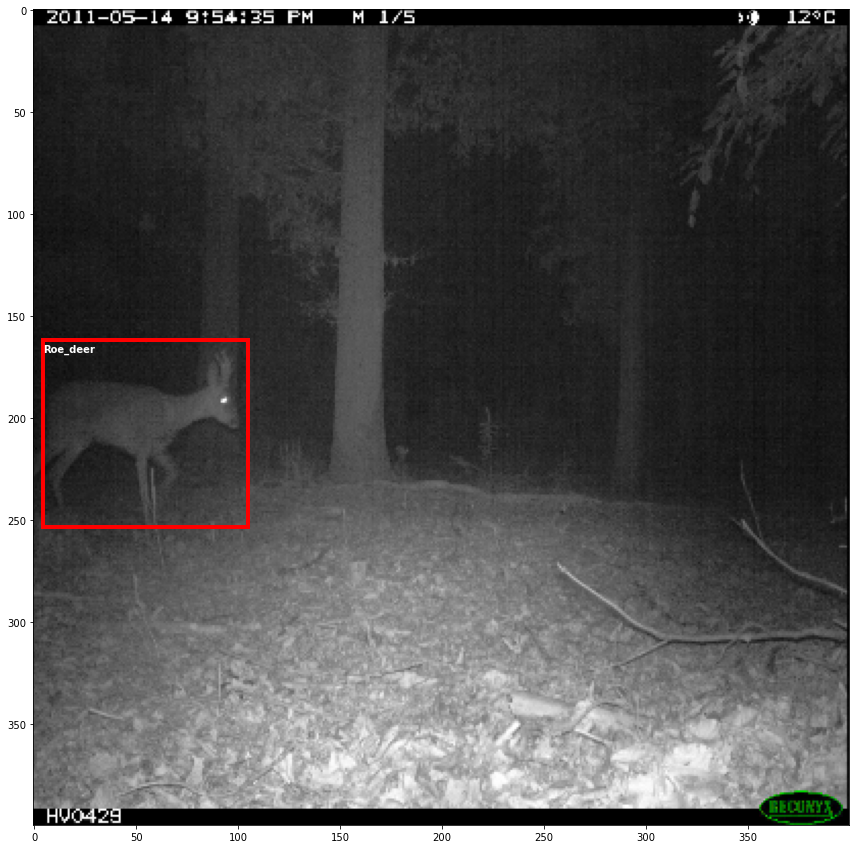

In [20]:
# Let's see three images with labels and boxes from the training data
images,targets = next(iter(train_loader))
for image_idx in range(len(images[:3])):
    fig, ax = plt.subplots(1, figsize=(15,15))
    image = np.rollaxis(images[image_idx].cpu().detach().numpy(), 0, 3)
    ax.imshow(image)
    box = targets[image_idx]['boxes'] 
    labels = targets[image_idx]['labels'].cpu().detach().numpy()
    labels = ([target2label[i] for i in labels])    
    for i in range(len(box)):
    #print(target[i]['boxes'])     
        left, bot, right, top = box[i].numpy() #target['boxes'][idx]
        x, y, w, h = [val for val in [left, bot, right - left, top - bot]]
        rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor='r', fill=False) 
        ax.add_patch(rect)
        ax.annotate(labels[i], (x,y+2), color='white', weight='bold',
                    ha='left', va='top', font='FONT_HERSHEY_SIMPLEX')

plt.show()

**Summary**
* Data are ready for training.

## 5) Training

* `Faster RCNN` model with the backbone `resnet50_fpn` was chosen for the fine-tuning.
* According to the "Weakly Supervised Faster-RCNN+FPN to classify animals in camera trap images" paper (https://arxiv.org/pdf/2208.14060.pdf) this model is more suitable for small objects on camera trap data.

In [15]:
# Funcion to create a model with num_classes
def get_model():
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

* During validation I will use mean Average Precision (mAP) metric.

In [16]:
metric = MeanAveragePrecision()

# train funcion
def train_model(model, data_loader=None, num_epoch=None):
    train_loss_values = []
    train_loss_classifier = []
    val_loss_values = []
  
    the_last_mAP = 0.01
    patience = 3
    trigger_times = 0
    
    for epoch in range(1, num_epoch + 1):
        print(f"Starting epoch {epoch} of {num_epoch}")
          
        torch.cuda.empty_cache()

        time_start = time.time()
        loss_accum = 0.0
        loss_classifier_accum = 0.0
        
        model.train()
        
        for batch_idx, (images, targets) in enumerate(data_loader, 1):

            # Predict
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())
            
            
            
            # Backprop
            optimizer.zero_grad()
                   
            
            loss.backward()
            optimizer.step()
            
            # General losses
            loss_accum += loss.item()
            
            # Class loss
            loss_classifier_accum += loss_dict['loss_classifier'].item()
            
            wandb.log({"train_loss": loss.item(), "train_class_loss": loss_dict['loss_classifier'].item()})

            if batch_idx % 10 == 0:
                print(f"    [Batch {batch_idx:3d} / {n_batches_train:3d}] Batch train loss: {loss.item():7.3f} | Train class loss: {loss_dict['loss_classifier'].item():7.3f}.")

            
        #lr_scheduler.step(loss)
            
        lr_scheduler.step()

        # Train losses
        train_loss = loss_accum / n_batches_train
        
        
        
        # Store the loss value for training
        train_loss_values.append(train_loss)
        
        # train_loss_class = loss_class / n_batches_train
        train_loss_class = loss_classifier_accum / n_batches_train
        train_loss_classifier.append(train_loss_class )
        
        
        
        
        del(images, targets) # to optimize GPU memory - delete images and targets after each epoch
        
        elapsed = time.time() - time_start

        torch.save(model.state_dict(), f"pytorch_model-e{epoch}.pt")
        prefix = f"[Epoch {epoch:2d} / {num_epoch:2d}]"
        
        print(f"{prefix} Train loss: {train_loss:7.3f} | Train class loss : {train_loss_class:7.3f} [{elapsed:.0f} secs]", end=' | ')
        
        preds_single = []
        targets_single = []
        
        for batch_idx, (images, targets) in enumerate(val_loader, 1):
            
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            targets_single.extend(targets)
    
            model.eval()
            with torch.no_grad():
                pred = model(images)
            
            preds_single.extend(pred)
        
        metric.update(preds_single, targets_single)
        
        batch_map = metric.compute()
       
        val_loss_values.append(batch_map)
        print(f"Val mAP: {batch_map['map']}")

        if batch_map['map'] < 0.01:
            wandb.alert(
            title='Low mAP',
          
            level=AlertLevel.WARN,
            wait_duration=timedelta(minutes=5)
          )


        # early stopping
        if batch_map['map'] < the_last_mAP:
            trigger_times += 1
            print('trigger times:', trigger_times)

            if trigger_times >= patience:
                print('Early stopping!')
                return model, train_loss_values, train_loss_classifier, val_loss_values

        else:
            print('trigger times: 0')
            trigger_times = 0

        the_last_mAP = batch_map['map']
        
    wandb.finish()   
        
    return model, train_loss_values, train_loss_classifier, val_loss_values


In [ ]:
# Hyperparameters of the model
model = get_model().to(device)
params = [p for p in model.parameters() if p.requires_grad] # freeze layers for fine-tuning
optimizer = torch.optim.SGD(params, lr=0.001,  momentum=0.9, weight_decay=0.0005)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=10,gamma=0.1) 

#optimizer = torch.optim.SGD(params, lr=0.005,  momentum=0.9, weight_decay=0.0005)
#optimizer = torch.optim.Adam(params , lr=0.001, weight_decay=1e-4)

#lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.1, patience=3) 

#lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=3,gamma=0.1)
                                            

In [39]:
# Weights & Biases for logging
import wandb

wandb.init(project="Faster RCNN", entity="podturkin",
          config={

   "num_epoch": 50
    })
!wandb login



wandb: Currently logged in as: podturkin. Use `wandb login --relogin` to force relogin


In [32]:
!nvidia-smi

Wed Jan 25 23:26:51 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    33W / 250W |    987MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Training 1st

In [40]:
# Train model for 50 epochs
num_epoch = 50
model, train_loss_values, train_loss_classifier, val_loss_values = train_model(model, data_loader=train_loader, num_epoch=num_epoch)

Starting epoch 1 of 50
    [Batch  10 /  88] Batch train loss:   0.944 | Train class loss:   0.478.
    [Batch  20 /  88] Batch train loss:   0.376 | Train class loss:   0.173.
    [Batch  30 /  88] Batch train loss:   0.547 | Train class loss:   0.300.
    [Batch  40 /  88] Batch train loss:   0.336 | Train class loss:   0.191.
    [Batch  50 /  88] Batch train loss:   0.349 | Train class loss:   0.184.
    [Batch  60 /  88] Batch train loss:   0.276 | Train class loss:   0.135.
    [Batch  70 /  88] Batch train loss:   0.343 | Train class loss:   0.189.
    [Batch  80 /  88] Batch train loss:   0.349 | Train class loss:   0.188.
[Epoch  1 / 50] Train loss:   0.502 | Train class loss :   0.294 [90 secs] | Val mAP: 0.011209690943360329
trigger times: 0
Starting epoch 2 of 50
    [Batch  10 /  88] Batch train loss:   0.344 | Train class loss:   0.182.
    [Batch  20 /  88] Batch train loss:   0.438 | Train class loss:   0.225.
    [Batch  30 /  88] Batch train loss:   0.341 | Train clas

train_class_loss,▄▆▅▅▅▆▄█▂▃▂▅▂▅▃▃▃▃▂▄▂▂▃▄▃▂▃▄▁▂▂▁▄▃▄▆▂▂▃▃
train_loss,▄▆▆▅▅▆▇█▂▅▃▄▃▅▃▅▄▂▂▅▃▂▄▄▃▂▂▆▂▂▂▁▆▅▆▆▂▃▂▅
train_class_loss,0.11347
train_loss,0.32403


In [42]:
!nvidia-smi

Thu Jan 26 03:17:04 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    33W / 250W |   8243MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Save the model with the best parameters
torch.save(model.state_dict(), 'best-model-parameters.pt')

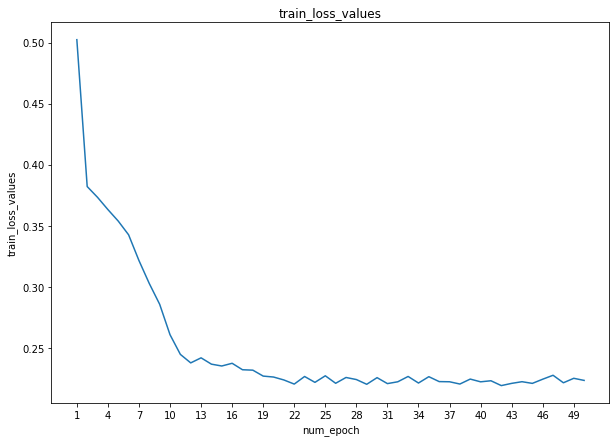

In [54]:
# Let's see the dynamic of training loss
plt.figure(figsize=(10,7))
plt.plot(np.arange(1, num_epoch+1), train_loss_values)
plt.xlabel('num_epoch')
plt.xticks(np.arange(1, num_epoch+1, step=3))
plt.ylabel('train_loss_values')
plt.title('train_loss_values')
None

* Training loss stopped decreasing after 22-25 epoch.

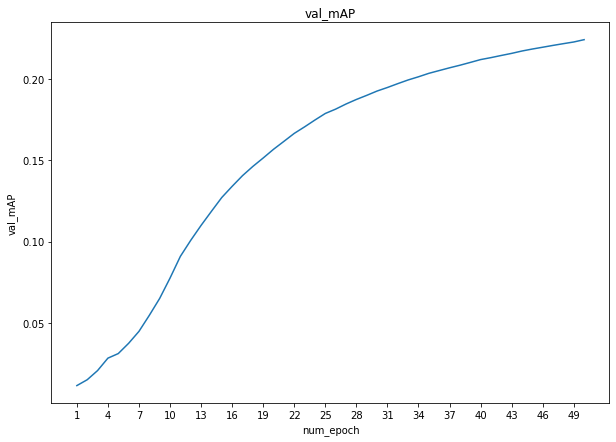

In [53]:
# Mean average precision on validation set
plt.figure(figsize=(10,7))
mAP = [val_loss_values[i]['map'].cpu().detach().numpy() for i, k in enumerate(val_loss_values)]
plt.plot(np.arange(1, num_epoch+1), mAP)
plt.xticks(np.arange(1, num_epoch+1, step=3))
plt.xlabel('num_epoch')
plt.ylabel('val_mAP')
plt.title('val_mAP')
None

* However, the mAP on the validation set grew without stopping, so no overfitting.
* The model has potential and it can be trained again.

### Training 2nd

In [29]:
# Load pre-trained weights

model = get_model().to(device)
model.load_state_dict(torch.load(f'/kaggle/input/reconyxcameratrapdata/best-model-parameters_50_epochs.pt'))
params = [p for p in model.parameters() if p.requires_grad]

# Change optimizer and decrease learning rate
optimizer = torch.optim.Adam(params , lr=1e-4, weight_decay=1e-4, betas=(0.9, 0.999))


# Modify the step_size of the optimizer to 5.
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=5,gamma=0.1)



In [30]:
import wandb

wandb.init(project="Faster RCNN", entity="podturkin",
          config={

   "num_epoch": 25
    })
!wandb login


num_epoch = 25
model, train_loss_values, train_loss_classifier, val_loss_values = train_model(model, data_loader=train_loader, num_epoch=num_epoch)

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


wandb: Currently logged in as: podturkin. Use `wandb login --relogin` to force relogin
Starting epoch 1 of 25
    [Batch  10 /  88] Batch train loss:   0.420 | Train class loss:   0.205.
    [Batch  20 /  88] Batch train loss:   0.320 | Train class loss:   0.193.
    [Batch  30 /  88] Batch train loss:   0.271 | Train class loss:   0.154.
    [Batch  40 /  88] Batch train loss:   0.237 | Train class loss:   0.136.
    [Batch  50 /  88] Batch train loss:   0.245 | Train class loss:   0.147.
    [Batch  60 /  88] Batch train loss:   0.215 | Train class loss:   0.119.
    [Batch  70 /  88] Batch train loss:   0.223 | Train class loss:   0.123.
    [Batch  80 /  88] Batch train loss:   0.443 | Train class loss:   0.156.
[Epoch  1 / 25] Train loss:   0.296 | Train class loss :   0.157 [90 secs] | Val mAP: 0.20155932009220123
trigger times: 0
Starting epoch 2 of 25
    [Batch  10 /  88] Batch train loss:   0.229 | Train class loss:   0.131.
    [Batch  20 /  88] Batch train loss:   0.227 | T

train_class_loss,█▇▅█▄▂▄▃▃▂▂▂▂▁▁▂▂▁▂▂▂▂▁▂▁▂▂▂▂▃▁▁▁▁▁▁▁▁▁▂
train_loss,▆▅▄█▄▃▅▃▃▂▂▂▂▂▁▁▃▂▂▁▂▂▁▁▁▁▂▂▂▄▂▁▂▁▂▁▁▁▁▂
train_class_loss,0.02442
train_loss,0.06092


In [31]:
# Save the model with the best parameters
torch.save(model.state_dict(), 'best-model-parameters_75_epochs.pt')

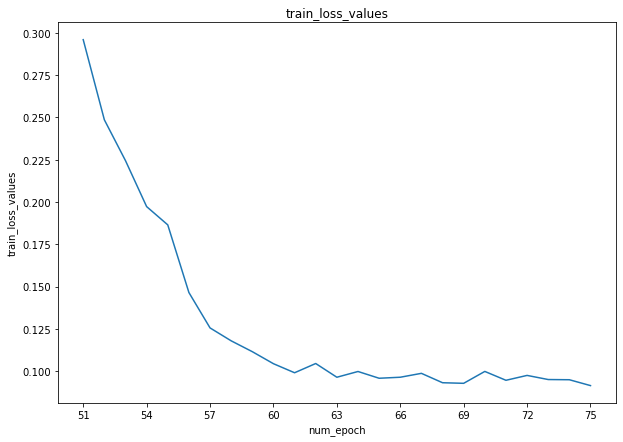

In [37]:
# Let's see the dynamic of training loss
plt.figure(figsize=(10,7))
plt.plot(np.arange(51, num_epoch+51), train_loss_values)
plt.xlabel('num_epoch')
plt.xticks(np.arange(51, num_epoch+51, step=3))
plt.ylabel('train_loss_values')
plt.title('train_loss_values')
None

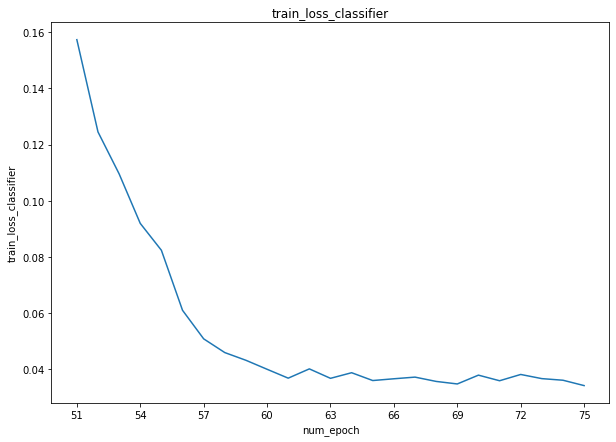

In [38]:
# Let's see the dynamic of training loss classifier
plt.figure(figsize=(10,7))
plt.plot(np.arange(51, num_epoch+51), train_loss_classifier)
plt.xlabel('num_epoch')
plt.xticks(np.arange(51, num_epoch+51, step=3))
plt.ylabel('train_loss_classifier')
plt.title('train_loss_classifier')
None

* Training losses decreased only for 11 epochs and after that, they did not change.

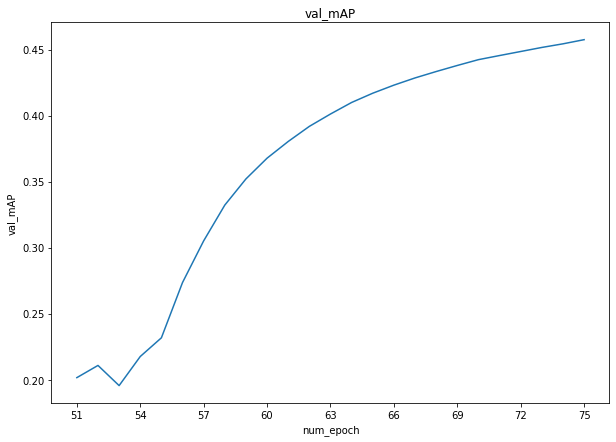

In [39]:
# Mean average precision on validation set
plt.figure(figsize=(10,7))
mAP = [val_loss_values[i]['map'].cpu().detach().numpy() for i, k in enumerate(val_loss_values)]
plt.plot(np.arange(51, num_epoch+51), mAP)
plt.xticks(np.arange(51, num_epoch+51, step=3))
plt.xlabel('num_epoch')
plt.ylabel('val_mAP')
plt.title('val_mAP')
None

* `mAP` on the validation set grew during the entire training, which indicates the potential of the model, and reached 45.7%.

### Training 3rd

In [17]:
# Load pre-trained weights

model = get_model().to(device)
model.load_state_dict(torch.load(f'/kaggle/input/reconyxcameratrapdata/best-model-parameters_75_epochs.pt'))
params = [p for p in model.parameters() if p.requires_grad]

# Change lr and weight_decay to 1e-5
optimizer = torch.optim.Adam(params , lr=1e-5, weight_decay=1e-5, betas=(0.9, 0.999))


lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=5,gamma=0.1)



import wandb

wandb.init(project="Faster RCNN", entity="podturkin",
          config={

   "num_epoch": 27
    })
!wandb login


num_epoch = 27
model, train_loss_values, train_loss_classifier, val_loss_values = train_model(model, data_loader=train_loader, num_epoch=num_epoch)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


wandb: Currently logged in as: podturkin. Use `wandb login --relogin` to force relogin
Starting epoch 1 of 27
    [Batch  10 /  88] Batch train loss:   0.071 | Train class loss:   0.026.
    [Batch  20 /  88] Batch train loss:   0.078 | Train class loss:   0.033.
    [Batch  30 /  88] Batch train loss:   0.085 | Train class loss:   0.030.
    [Batch  40 /  88] Batch train loss:   0.058 | Train class loss:   0.028.
    [Batch  50 /  88] Batch train loss:   0.149 | Train class loss:   0.051.
    [Batch  60 /  88] Batch train loss:   0.053 | Train class loss:   0.020.
    [Batch  70 /  88] Batch train loss:   0.125 | Train class loss:   0.039.
    [Batch  80 /  88] Batch train loss:   0.079 | Train class loss:   0.034.
[Epoch  1 / 27] Train loss:   0.100 | Train class loss :   0.039 [94 secs] | Val mAP: 0.52809739112854
trigger times: 0
Starting epoch 2 of 27
    [Batch  10 /  88] Batch train loss:   0.076 | Train class loss:   0.028.
    [Batch  20 /  88] Batch train loss:   0.197 | Trai

train_class_loss,▃▇▁▄▆▃▁▂▂▂▁▁▃▅▂▂▂▃▁█▂▁▃▃▃▂▁▂▃▁▄▅▅▅▃▁▁▄▂▁
train_loss,▂▄▁▄▄▃▁▂▂▂▁▁▃▅▂▂▂▃▁█▂▂▃▂▃▂▁▂▃▂▄▆▇▅▂▁▂▄▂▂
train_class_loss,0.04723
train_loss,0.15491


In [19]:
# Save the model with the best parameters after 102 epochs
torch.save(model.state_dict(), 'best-model-parameters.pt')


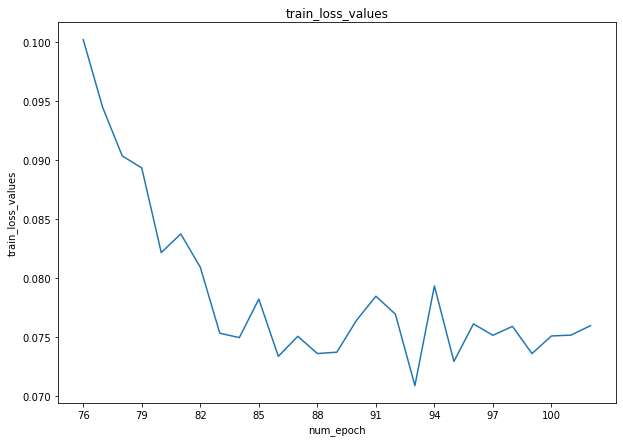

In [20]:
# Let's see the dynamic of training loss
plt.figure(figsize=(10,7))
plt.plot(np.arange(76, num_epoch+76), train_loss_values)
plt.xlabel('num_epoch')
plt.xticks(np.arange(76, num_epoch+76, step=3))
plt.ylabel('train_loss_values')
plt.title('train_loss_values')
None

* Training loss didn't changed dramatically compare to previous iterations. The minimum of the training loss was reached on 18 (+75) epoch.

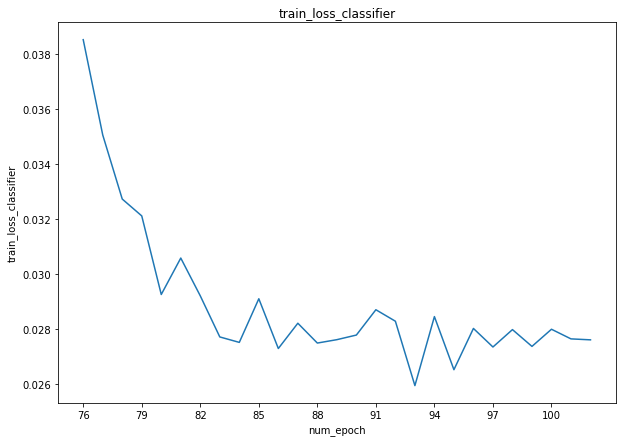

In [21]:
# Let's see the dynamic of training loss classifier
plt.figure(figsize=(10,7))
plt.plot(np.arange(76, num_epoch+76), train_loss_classifier)
plt.xlabel('num_epoch')
plt.xticks(np.arange(76, num_epoch+76, step=3))
plt.ylabel('train_loss_classifier')
plt.title('train_loss_classifier')
None

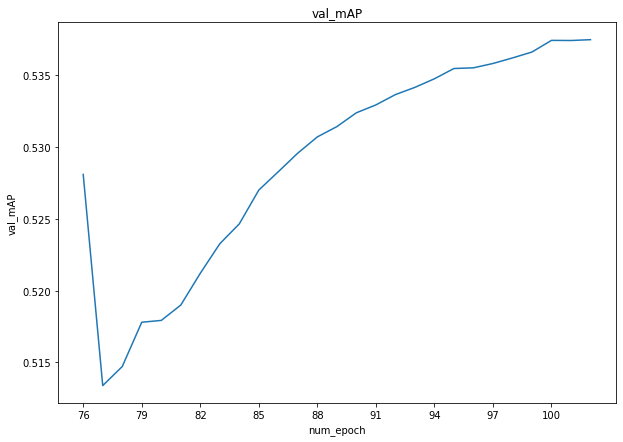

In [22]:
# Mean average precision on validation set
plt.figure(figsize=(10,7))
mAP = [val_loss_values[i]['map'].cpu().detach().numpy() for i, k in enumerate(val_loss_values)]
plt.plot(np.arange(76, num_epoch+76), mAP)
plt.xticks(np.arange(76, num_epoch+76, step=3))
plt.xlabel('num_epoch')
plt.ylabel('val_mAP')
plt.title('val_mAP')
None

* `mAP` on the validation dataset reached 53.7%.

## 6) Inference

* Let's evaluate the quality of the model on the validation images.

In [14]:
model = get_model().to(device)
#model.load_state_dict(torch.load(f'/kaggle/input/reconyxcameratrapdata/best-model-parameters.pt'))

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

<All keys matched successfully>

In [23]:
# Get prediction and ground truth - validation dataset
preds_single = []
targets_single = []

for batch_idx, (images, targets) in tqdm(enumerate(val_loader, 1)):

    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    targets_single.extend(targets)

    model.eval()
    with torch.no_grad():
        pred = model(images)

    preds_single.extend(pred)


26it [00:13,  1.92it/s]


In [24]:
# Get only ground truth labels
labels = []
for n, l in enumerate(targets_single):
    labels.append(l['labels'].detach().cpu().numpy())
    
from more_itertools import flatten
flat_list = list(flatten(labels))
labels = [torch.tensor(i) for i in flat_list]  # make a flatten list of labels

In [25]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!cp Tutorial-Book-Utils/utils_ObjectDetection.py ./
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 36, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 36 (delta 12), reused 17 (delta 5), pack-reused 0
Unpacking objects: 100% (36/36), 9.65 KiB | 898.00 KiB/s, done.


In [26]:
# Let's get metrics for each class
sample_metrics = []
sample_metrics += utils.get_batch_statistics(preds_single, targets_single, iou_threshold=0.5) 
sample_metrics = utils.get_batch_statistics(preds_single, targets_single, iou_threshold=0.5) 
true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))] 
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))



In [27]:
# Report a table with average precision for each class
ap_class_name = [target2label[i] for i in ap_class.numpy().astype(int)]
data = [ap_class_name, AP.numpy()]

pd.DataFrame(data, index=['Class', 'AP'])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
Class,Tinamou,White_tailed_deer,Common_opossum,Spiny_rat,Red_squirrel,Red_deer,Red_fox,European_hare,Mouflon,White_nosed_coati,Ocelot,Agouti,Roe_deer,Bird_spec,Wild_boar,Paca,Wood_mouse,Red_brocket_deer,Collared_peccary
AP,0.98,0.90,0.78,0.32,0.99,0.88,0.69,0.96,0.85,0.78,0.92,0.79,0.98,0.75,0.81,1.00,0.99,0.98,0.89


* The lowest `AP` was 0.32 for Spiny rats.
* The highest score reached 1 for Paca.

* Let's look at the quality of the model on test images, which the model has not yet seen.

In [28]:
# Transform to numpy and normalize
# Download an image of a deer
!wget https://cdn.britannica.com/60/122960-050-0959F3EA/Roe-deer-antlers-buck-slovakia.jpg -O deer_photo.jpg

img = cv2.imread('/kaggle/working/deer_photo.jpg') # в numpy array , cv2.IMREAD_COLOR
image_res = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
image_res = cv2.resize(image_res, (400, 400), cv2.INTER_AREA)/255.0 # normalize

# Transform to the model format (+ add dimension)
img_torch = torch.Tensor(np.rollaxis(image_res, 2, 0))
img_torch = torch.unsqueeze(img_torch, dim=0)
img_torch.size()



--2023-01-28 22:35:19--  https://cdn.britannica.com/60/122960-050-0959F3EA/Roe-deer-antlers-buck-slovakia.jpg
Resolving cdn.britannica.com (cdn.britannica.com)... 108.156.60.26, 108.156.60.126, 108.156.60.78, ...
Connecting to cdn.britannica.com (cdn.britannica.com)|108.156.60.26|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 245886 (240K) [image/jpeg]
Saving to: ‘deer_photo.jpg’

deer_photo.jpg      100%[===================>] 240.12K   626KB/s    in 0.4s    

2023-01-28 22:35:20 (626 KB/s) - ‘deer_photo.jpg’ saved [245886/245886]



torch.Size([1, 3, 400, 400])

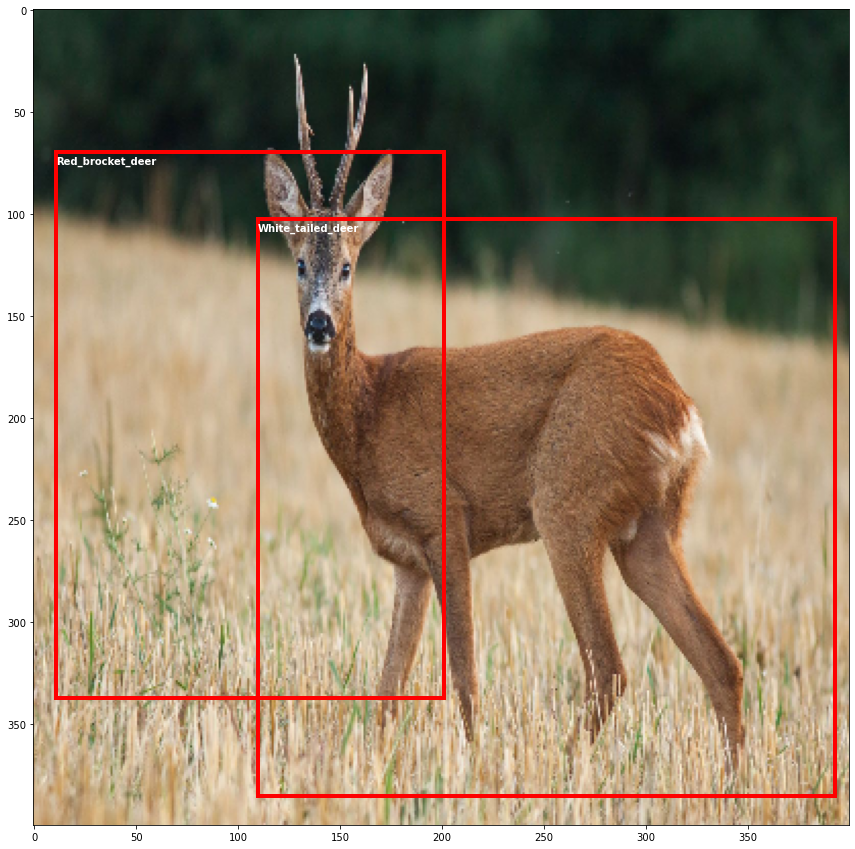

In [36]:
# Let's get a prediction with the new weights
model.eval()
with torch.no_grad():
    pred = model(img_torch.to(device))
    
    
    
# Print an image + boxes
fig, ax = plt.subplots(1, figsize=(15,15))
ax.imshow(image_res)
for n, pr in enumerate(pred):
    boxes = pred[n]['boxes'].cpu().detach().numpy()
    labels = [target2label[i] for i in list(pred[n]['labels'].cpu().detach().numpy())] 
    scores = pred[n]['scores'].cpu().detach().numpy()
    boxes = boxes[scores > 0.5] # threshold 50%
    for ind, b in enumerate(boxes):
        left, bot, right, top = b 
        x, y, w, h = [val for val in [left, bot, right - left, top - bot]]
        rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor='r', fill=False) 
        ax.add_patch(rect)
        ax.annotate(labels[ind], (x,y+2), color='white', weight='bold',
                    ha='left', va='top', font='FONT_HERSHEY_SIMPLEX') 
plt.show()        

* The prediction is not accurate.

**Test loader**

In [41]:
metric_test = MeanAveragePrecision()

preds_single = []
targets_single = []

for batch_idx, (images, targets) in tqdm(enumerate(test_loader, 1)):

    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    targets_single.extend(targets)

    model.eval()
    with torch.no_grad():
        pred = model(images)

    preds_single.extend(pred)

metric_test.update(preds_single, targets_single)
test_map = metric_test.compute()

print(f"Test mAP: {test_map['map']}")


24it [00:02, 10.29it/s]


Test mAP: 0.6490547060966492


In [47]:
torch.save(preds_single, 'preds_single.pt')
torch.save(targets_single, 'targets_single.pt')

* `mAP` on the test sample reached 64.9%.

In [84]:
preds_single = torch.load('/kaggle/input/reconyxcameratrapdata/prediction.pt', map_location=torch.device('cpu'))

In [85]:
targets_single  = torch.load('/kaggle/input/reconyxcameratrapdata/targets.pt', map_location=torch.device('cpu'))

24it [00:03,  7.32it/s]


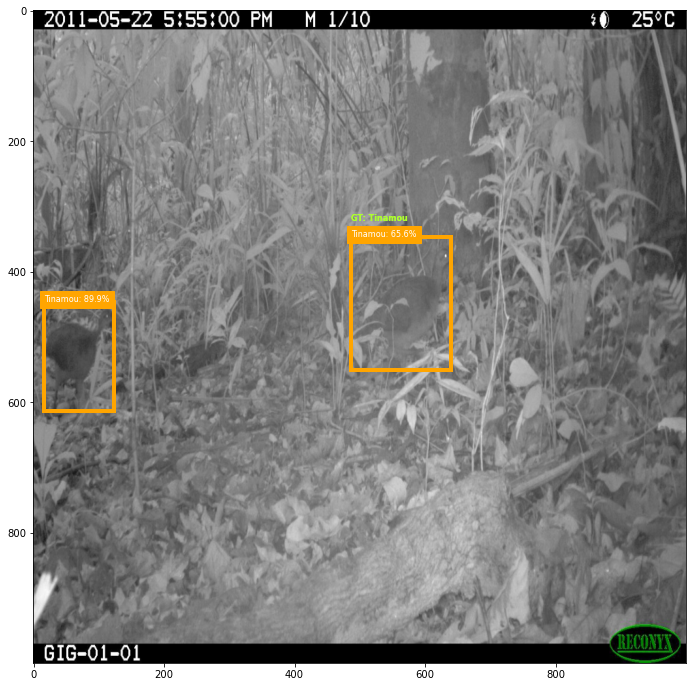

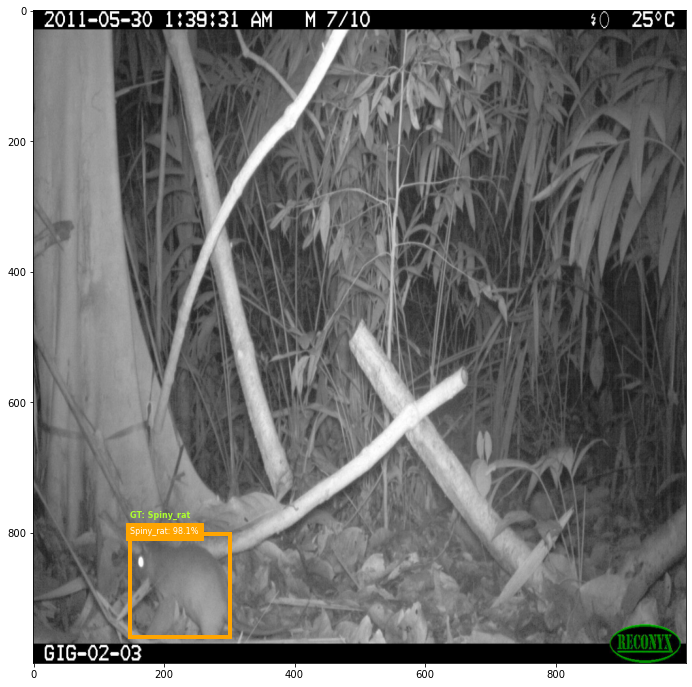

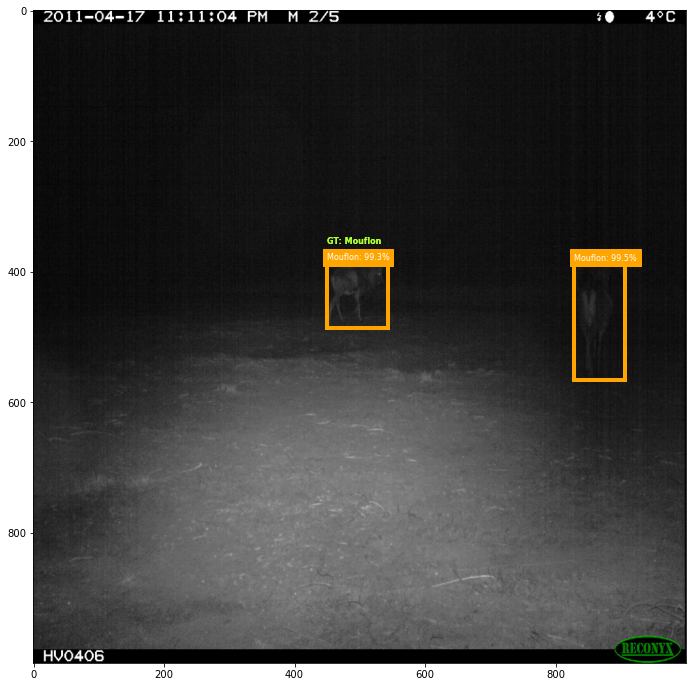

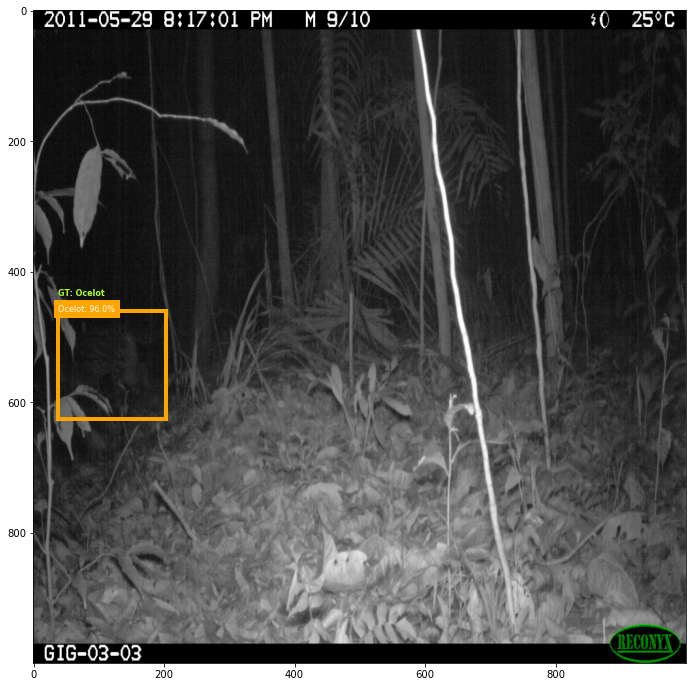

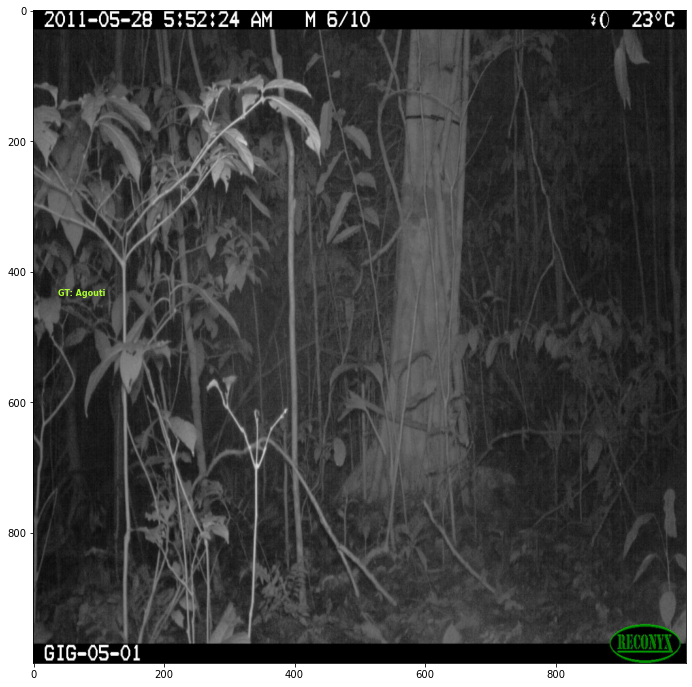

...

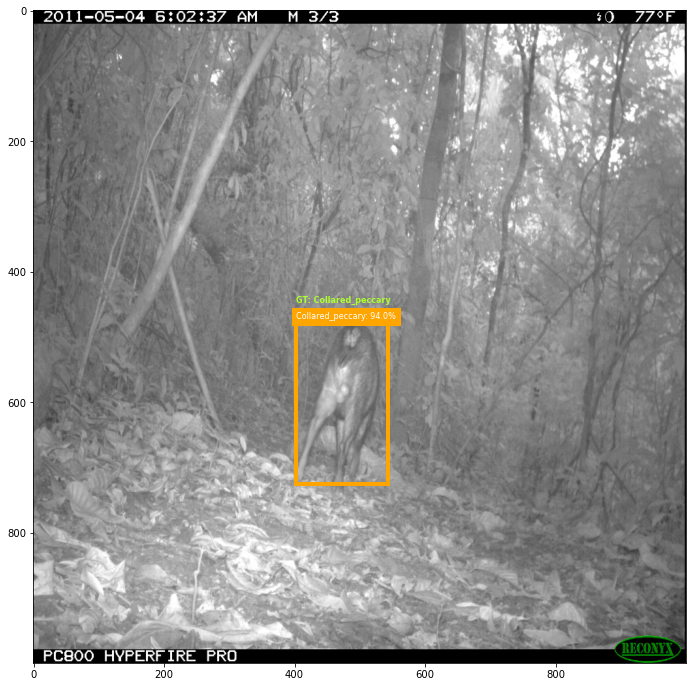

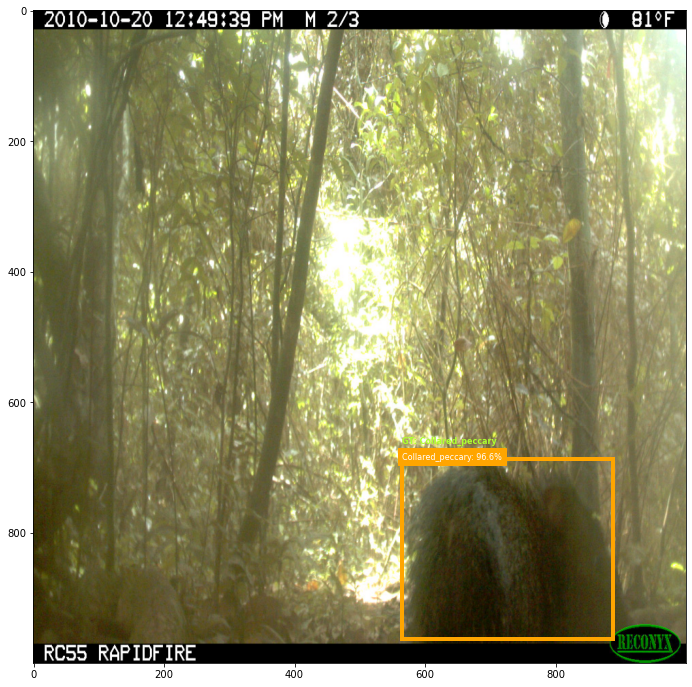

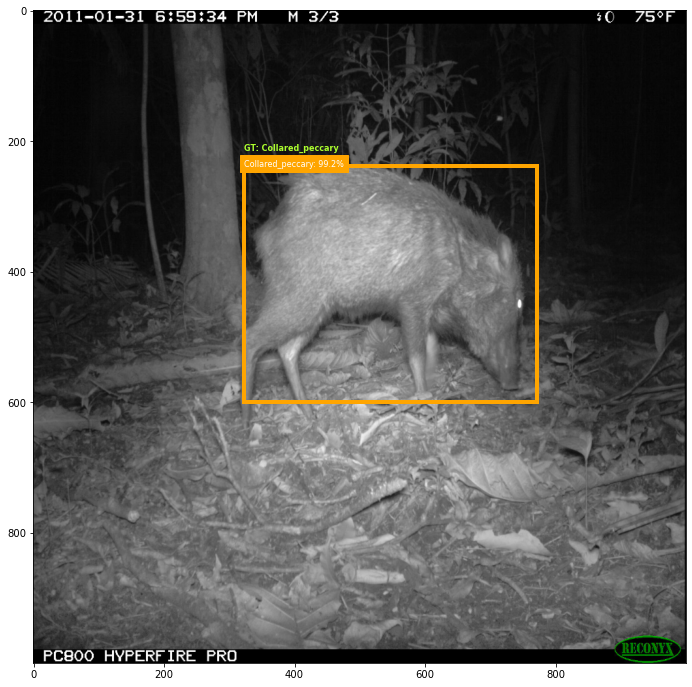

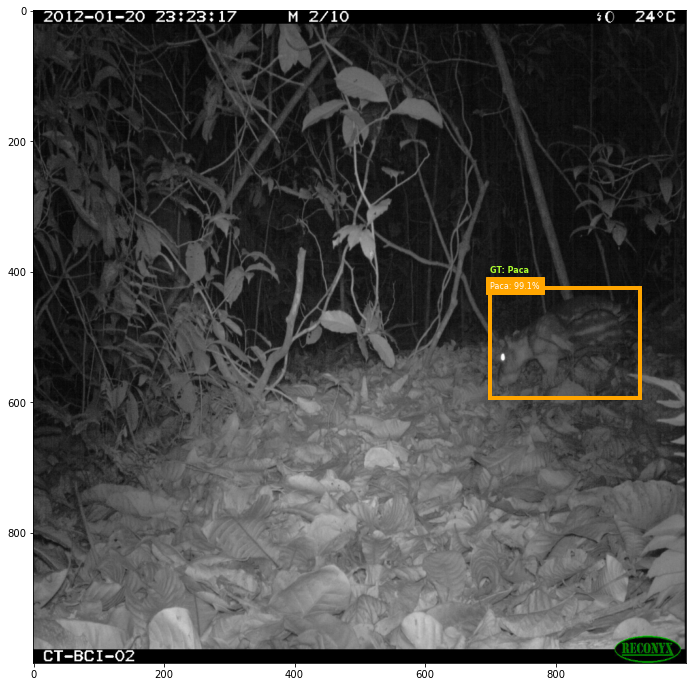

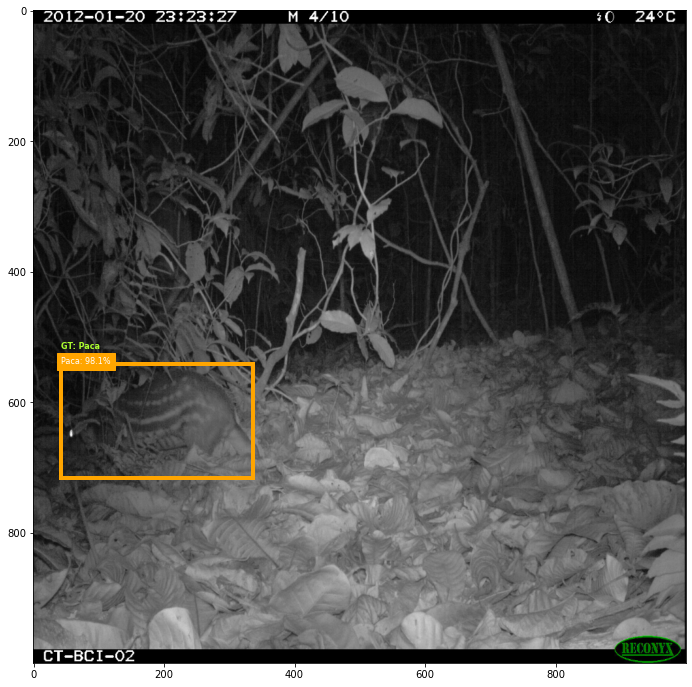

In [45]:
# Test images with predicted classes and bounding boxes
import matplotlib.pyplot as plt
plt.rcParams['figure.max_open_warning'] = 50

detection_threshold = 0.60 # set the threshold on 60%
for batch_idx, (images, targets) in tqdm(enumerate(test_loader)):
    boxes = preds_single[batch_idx]['boxes'].cpu().detach().numpy()
    labels = preds_single[batch_idx]['labels'].cpu().detach().numpy()
    labels = ([target2label[i] for i in labels]) 
    conf = preds_single[batch_idx]['scores'].cpu().detach().numpy()
    
    true_labels = targets[0]['labels'].cpu().detach().numpy()
    true_labels = ([target2label[i] for i in true_labels]) 
    
    boxes = boxes[conf >= detection_threshold].astype(np.float32)
    
    fig, ax = plt.subplots(1, figsize=(12,12))
    image = np.rollaxis(images[0].cpu().detach().numpy(), 0, 3)
    ax.imshow(np.rollaxis(images[0].cpu().detach().numpy(), 0, 3))
    
    
    for n, b in enumerate(boxes):
        
        left, bot, right, top = b 
        x, y, w, h = [val for val in [left, bot, right - left, top - bot]]
        rect = patches.Rectangle((x, y), w, h, linewidth=4, edgecolor='orange', fill=False)
        ax.add_patch(rect)
        
       # Display predicted labels and confidence 
        ax.text(x, y, f'{labels[n]}: {conf[n]*100:.1f}%', fontsize=8, color='white', 
                backgroundcolor='orange')

   # Display ground truth labels         
    for n, tr in enumerate(true_labels):
        ax.annotate(f'GT: {true_labels[n]}', (x,y-35), color='greenyellow', weight='bold',
                 ha='left', va='top', font='FONT_HERSHEY_SIMPLEX', fontsize=8) # fontsize=10,)       
              


**Summary**
* The model predicted correct class and location on 22 from 24 images with confidence, at least, more than 60% and up to 99%.

## 7) Future directions: Implementation

* This approach shows that it is possible to use a model to automatically detect and classify animals from camera trap images, which can make it easier for field zoologists and ecologists to analyze the numbers and species of local fauna. Even with the small size of several objects and challenging night and foggy shooting conditions, the model is able to make accurate predictions of localization and class for some objects of different size.
* However, it may be necessary to use additional methods to balance the sample, since the range of `AP` was between 32% to 100%.
* The model has undergone 102 epochs of training and the mAP reached 64.9% on 24 random images. Nevertheless, it was not enough, since the mAP on the validation set was lower and the bounding box on the random image from the Internet was not accurate. 
According to "Weakly Supervised Faster-RCNN+FPN to classify animals in camera trap
images" paper (https://arxiv.org/pdf/2208.14060.pdf) 200 epochs is necessary to reach the best performance. 
Therefore, fine-tuning for 200 epochs with photos specific to the location is necessary for optimal performance in field tests. The model may be implemented on a server for automatic detection to occur.

* P.S.: Here I was trying to use `WeightedRandomSampler` to weight each class, but it didn't work.

In [ ]:
# # Weight classes
# from collections import Counter
# from torch.utils.data.sampler import WeightedRandomSampler

# class_counts = list(Counter(train_labels.label).values())
# batch_size=10

# weights = 1 / torch.Tensor(class_counts)

# sampler = WeightedRandomSampler(weights, batch_size)

# # Train Dataloader
# train_loader = torch.utils.data.DataLoader(train_dataset,
#                                            sampler=sampler,
#                                            batch_size=10, 
#                                            num_workers=2,
#                                            collate_fn=collate_fn, 
#                                            drop_last=True, 
#                                            pin_memory=True) 
